# DM-33104 Validate and integrate Josh Meyers fast geometric model (FGM) for donuts (replacing the compensable pmask and cmask)

Compare FGM with current pmask and cmask models
Integrate codebase into the AOS stack and with the image classes 

https://jira.lsstcorp.org/browse/DM-33104

## Danish mask

In [2]:
import yaml
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib as mpl
from matplotlib import rcParams 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


data = yaml.safe_load("""
radii:
  M1_outer: 4.180005408074665
  M1_inner: 2.5580033095346875
  M2_outer: 4.502721059044802
  M2_inner: 2.3698531889709487
  M3_outer: 5.4353949343626216
  M3_inner: 1.1919725733251365
  L1_entrance: 7.692939426566589
  L1_exit: 8.103064894823262
  L2_entrance: 10.746925431763076
  L2_exit: 11.548732622162085
  Filter_entrance: 28.06952057721957
  Filter_exit: 30.895257933242576
  L3_entrance: 54.5631834759912
  L3_exit: 114.76715786850136

motion:
  M1_outer: 0.1517605552388959
  M1_inner: 0.1517605552388959
  M2_outer: 16.818667026561727
  M2_inner: 16.818667026561727
  M3_outer: 53.2113063872138
  M3_inner: 53.2113063872138
  L1_entrance: 131.69949884635324
  L1_exit: 137.51151184228345
  L2_entrance: 225.63931108752732
  L2_exit: 236.8641351903567
  Filter_entrance: 801.6598843836333
  Filter_exit: 879.4647343264201
  L3_entrance: 1594.7432961792515
  L3_exit: 3328.637595923783
""")
# To predict obscuration of at thx = thy = 1.185 degrees,
# this is something like:
# thx = thy = np.deg2rad(1.185)
# thr = np.hypot(thx, thy)
# xs = np.linspace(-5, 5, 256)
# xs, ys = np.meshgrid(xs, xs)
# img = np.ones((256, 256))
# for key in data['radii'].keys():
#     motion = data['motion'][key]
#     radius = data['radii'][key]
#     rs = np.hypot(xs - thx*motion, ys - thy*motion)    
#     if key.endswith('inner'):
#         img[rs<radius] = 0
#     else:
#         img[rs>radius] = 0
# plt.figure()
# plt.imshow(img, extent=[-5,5,-5,5])
# plt.show()

# put that into a quick function so I can change focal plane location
def get_danish_mask(thxDeg, thyDeg, templateSize=256):
    
    data = yaml.safe_load("""
radii:
  M1_outer: 4.180005408074665
  M1_inner: 2.5580033095346875
  M2_outer: 4.502721059044802
  M2_inner: 2.3698531889709487
  M3_outer: 5.4353949343626216
  M3_inner: 1.1919725733251365
  L1_entrance: 7.692939426566589
  L1_exit: 8.103064894823262
  L2_entrance: 10.746925431763076
  L2_exit: 11.548732622162085
  Filter_entrance: 28.06952057721957
  Filter_exit: 30.895257933242576
  L3_entrance: 54.5631834759912
  L3_exit: 114.76715786850136

motion:
  M1_outer: 0.1517605552388959
  M1_inner: 0.1517605552388959
  M2_outer: 16.818667026561727
  M2_inner: 16.818667026561727
  M3_outer: 53.2113063872138
  M3_inner: 53.2113063872138
  L1_entrance: 131.69949884635324
  L1_exit: 137.51151184228345
  L2_entrance: 225.63931108752732
  L2_exit: 236.8641351903567
  Filter_entrance: 801.6598843836333
  Filter_exit: 879.4647343264201
  L3_entrance: 1594.7432961792515
  L3_exit: 3328.637595923783
""")
    
    thx = np.deg2rad(thxDeg)
    thy = np.deg2rad(thxDeg)
    thr = np.hypot(thx, thy)
    xs = np.linspace(-5, 5, templateSize)
    xs, ys = np.meshgrid(xs, xs)
    img = np.ones((templateSize, templateSize))
    for key in data['radii'].keys():
        motion = data['motion'][key]
        radius = data['radii'][key]
        rs = np.hypot(xs - thx*motion, ys - thy*motion)    
        if key.endswith('inner'):
            img[rs<radius] = 0
        else:
            img[rs>radius] = 0
    return img

Plot a donut at focal plane location `x,y = 1.185` degrees 

In [5]:
%%timeit 
get_danish_mask(1.185, 1.185, 156)
#plt.imshow(img, )#origin='lower')
#np.shape(img)

6.74 ms ± 109 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


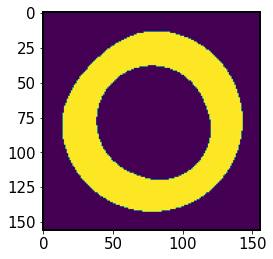

In [6]:
img =get_danish_mask(1.185, 1.185, 156)
plt.imshow(img, )

Show a more vignetted donut:

(156, 156)

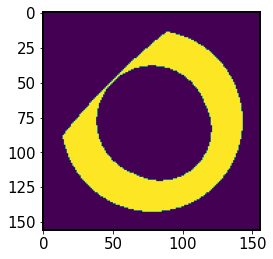

In [7]:
img = get_danish_mask( 1.285, 1.21, 156)
plt.imshow(img, )#origin='lower')
np.shape(img)

## Compensable image

What does the compensable image create? 

It is used in https://github.com/lsst-ts/ts_wep/blob/7561f2d20b36c051df0cdbb629d102bdcc260da7/python/lsst/ts/wep/cwfs/Algorithm.py#L1187 

and https://github.com/lsst-ts/ts_wep/blob/abd15793e7e0f0484de03661caf4c1783e78a24f/python/lsst/ts/wep/task/DonutStamp.py 

and 

https://github.com/lsst-ts/ts_wep/blob/c48e1528145edcc66af4c82e8ff9e068711cae99/python/lsst/ts/wep/WfEstimator.py

while it is defined in 

https://github.com/lsst-ts/ts_wep/blob/7561f2d20b36c051df0cdbb629d102bdcc260da7/python/lsst/ts/wep/cwfs/CompensableImage.py



In [8]:
from lsst.ts.wep.Utility import (
    getConfigDir,
    DonutTemplateType,
    DefocalType,
    CamType,
    getCamType,
    getDefocalDisInMm,
)
import os
from lsst.ts.wep.WfEstimator import WfEstimator
# configDir = getConfigDir()
# instDir = os.path.join(configDir, "cwfs", "instData")
# algoDir = os.path.join(configDir, "cwfs", "algo")
# wfEsti = WfEstimator(instDir, algoDir)
# instName = 'comcam'
# camType = getCamType(instName)
# defocalDisInMm = getDefocalDisInMm(instName)

# opticalModel="offAxis"

# donutStampSize = 160

In [6]:

# wfEsti.config(
#     sizeInPix=donutStampSize,
#     camType=camType,
#     opticalModel=opticalModel,
#     defocalDisInMm=defocalDisInMm,
# )


Get some comcam data, which already contains intra/extra focal stamps:

In [9]:
from lsst.daf import butler as dafButler

def get_butler_stamps(repoDir,instrument='LSSTComCam', iterN=0, detector="R22_S01",
                     dataset_type = 'donutStampsExtra', collection=''):
    #repoDir = '/project/scichris/aos/rotation_DM-31532/Ns_rotCam_0_c/phosimData/' 

    butler = dafButler.Butler(repoDir)
    registry = butler.registry
    if collection == '':
        collection=f'ts_phosim_90060{iterN}1'
    dataId0 = dict(instrument=instrument)
    dataset = next(iter(butler.registry.queryDatasets(
                            datasetType='postISRCCD',
                            dataId=dataId0, 
                            collections=[collection]  )
                       ))
    expN = dataset.dataId["exposure"]
    # construct a dataId for zernikes and donut catalog:
    # switch exposure to visit 
    
    dataId = {'detector':detector, 'instrument':instrument,
              'visit':expN}

    extraFocalStamps = butler.get(dataset_type, 
                              dataId=dataId, 
                              collections=[collection])  
    return extraFocalStamps

In [11]:
extraFocalStamps = get_butler_stamps('/project/scichris/aos/rotation_DM-31532/Ns_rotCam_0_c/phosimData/' )

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
for i in range(len(extraFocalStamps)):
    donutStamp = extraFocalStamps[i]
    print(donutStamp.calcFieldXY())

(-0.058194444444444444, -0.28991666666666666)
(-0.05819444444444446, -0.23447222222222222)
(-0.058194444444444444, -0.17902777777777773)
(-0.0027500000000000055, -0.28991666666666666)
(-0.0027500000000000055, -0.23447222222222222)
(-0.0027500000000000055, -0.1789722222222222)
(0.05269444444444444, -0.28986111111111107)
(0.052694444444444447, -0.23447222222222222)
(0.05269444444444444, -0.1789722222222222)


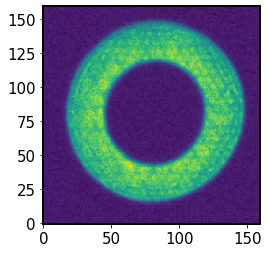

In [9]:
donutStamp = extraFocalStamps[0]
plt.imshow(donutStamp.stamp_im.image.array, origin='lower')

As in `WfEstimator` I set https://github.com/lsst-ts/ts_wep/blob/c48e1528145edcc66af4c82e8ff9e068711cae99/python/lsst/ts/wep/WfEstimator.py#L43 

In [10]:
from lsst.ts.wep.cwfs.Instrument import Instrument
from lsst.ts.wep.cwfs.CompensableImage import CompensableImage
from lsst.ts.wep.Utility import (
    getConfigDir,
    DonutTemplateType,
    DefocalType,
    CamType,
    getCamType,
    getDefocalDisInMm,
)
import os
def get_comp_image_for_donut(donutStamp, optical_model="offAxis",
                             inst_name='comcam',
                             donut_stamp_size=160, 
                             boundaryT=1, 
                             maskScalingFactorLocal =1 
                            ):
    ''' Get compensable image for field location 
    given the donut stamp
    
    Parameters:
    -----------
    optical_model : str
        Optical model. It can be "paraxial", "onAxis", or "offAxis".
    boundaryT : int
        Extended boundary in pixel. It defines how far the computation mask
        extends beyond the pupil mask. And, in fft, it is also the width of
        Neuman boundary where the derivative of the wavefront is set to
        zero.
    maskScalingFactorLocal : float
        Mask scaling factor (for fast beam) for local correction.
    '''
    
    
    imgIntra = CompensableImage() 

    # this is setup in WfEstimator
    config_dir=getConfigDir()
    inst_dir = os.path.join(config_dir, "cwfs", "instData")
    instrument = Instrument(inst_dir)

    camType = getCamType(inst_name)
    defocalDisInMm = getDefocalDisInMm(inst_name)
    instrument.config(
                camType, donut_stamp_size, announcedDefocalDisInMm=defocalDisInMm
            )

    # this is calling compensable image to make a mask
    # https://github.com/lsst-ts/ts_wep/blob/7561f2d20b36c051df0cdbb629d102bdcc260da7/python/lsst/ts/wep/cwfs/CompensableImage.py#L1410 


    # this is done in donutStamp, 
    # _makeCompensableImage()
    field_xy = donutStamp.calcFieldXY()

    imgIntra.setImg(
                field_xy,
                DefocalType.Extra,
                donutStamp.stamp_im.image.array
            )
    imgIntra.makeMask(instrument, optical_model, boundaryT, maskScalingFactorLocal)
    
    return imgIntra

Get compensable image:

In [14]:
%%timeit
imgIntra = get_comp_image_for_donut(extraFocalStamps[0])

5.39 ms ± 54.8 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


Get dmask for the same field location:

In [28]:
field_xy = extraFocalStamps[0].calcFieldXY()
dMask = get_danish_mask(field_xy[0], field_xy[1], 160)

### Compare cmask, pmask, and dmask

Try plotting it on top of the actual image. Show the part of the donut that did not get selected by either mask.

According to the docs , https://github.com/lsst-ts/ts_wep/blob/7561f2d20b36c051df0cdbb629d102bdcc260da7/python/lsst/ts/wep/cwfs/CompensableImage.py#L1464  `boundaryT` parameter  `defines how far the computation mask extends beyond the pupil mask.`. I think that the docstring which says 

      pMask: padded mask for use at the offset planes
      cMask: non-padded mask corresponding to aperture

is incorrect, as `pMask` seems to mean `pupil mask`, and `cMask` for `computation mask`, and the definitions above are opposite to truth (`cMask` is a padded version of `pMask`).
            
    Show that this is indeed the case. Calculate `comensableImage` with two different `boundaryT` values. Plot the mask:
    
(by extension I think that statements later in the same function calling `pMask` the "padded mask" and `cMask` the "non-padded mask corresponding to aperture" are just following the same mistake https://github.com/lsst-ts/ts_wep/blob/7561f2d20b36c051df0cdbb629d102bdcc260da7/python/lsst/ts/wep/cwfs/CompensableImage.py#L1487 ) 

Illustrate that `cMask` stands for `computation mask`, i.e. the padded version of `pMask`- the `pupil mask`, by changing the `boundaryT` value 

Text(0.5, 1.0, 'cMask, boundaryT=7')

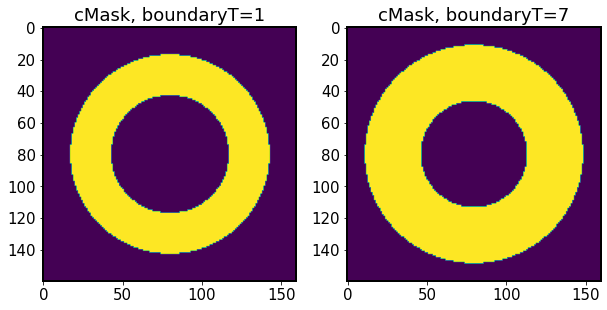

In [92]:
# change boundary size
comp_image1 = get_comp_image_for_donut(extraFocalStamps[0], boundaryT=1)
comp_image7 = get_comp_image_for_donut(extraFocalStamps[0], boundaryT=7)

fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(comp_image1.cMask)
ax[0].set_title('cMask, boundaryT=1')
ax[1].imshow(comp_image7.cMask)
ax[1].set_title('cMask, boundaryT=7')

So it looks like indeed `cmask` is the padded version of `pmask.`

Plot part of the donut NOT selected by by pMask (or cMask, or dMask):

PostISR image sum  2546914.8
Thresholded image sum: 2518262.2
image sum:  2546914.8
image[~pMask] sum: 416993.38
image[~cMask] sum: 15894.953
image[~dMask] sum: 327513.7


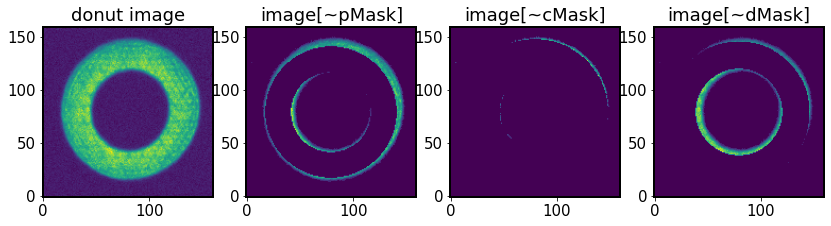

In [126]:
from copy import copy
comp_image = get_comp_image_for_donut(extraFocalStamps[0], boundaryT=1)
img = extraFocalStamps[0].stamp_im.image.array
print('PostISR image sum ', np.sum(img))

# figure out the background level
bkgnd_level = max(img[:,10])+10
img_t = copy(img)
# threshold the image so it's 0 below background level 
img_t[img<bkgnd_level] = 0
print('Thresholded image sum:', np.sum(img_t))

# convert pmask to bool, then invert 
inv_pmask = ~np.bool_(imgIntra.pMask)
inv_cmask = ~np.bool_(imgIntra.cMask)
inv_dmask = ~np.bool_(dMask)

# multiply image by the mask
pimage = inv_pmask*img_t
cimage = inv_cmask*img_t
dimage = inv_dmask*img_t

fig,ax = plt.subplots(1,4,figsize=(14,4))

ax[0].imshow(img, origin='lower')
ax[0].set_title('donut image')
ax[1].imshow(pimage, origin='lower')
ax[1].set_title('image[~pMask]')
ax[2].imshow(cimage, origin='lower')
ax[2].set_title('image[~cMask]')
ax[3].imshow(dimage, origin='lower')
ax[3].set_title('image[~dMask]')

print('image sum: ', np.sum(img))
print('image[~pMask] sum:', np.sum(pimage))
print('image[~cMask] sum:', np.sum(cimage))
print('image[~dMask] sum:', np.sum(dimage))



In [128]:
pimage

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

plot the cut through non-donut part to assess the background level:

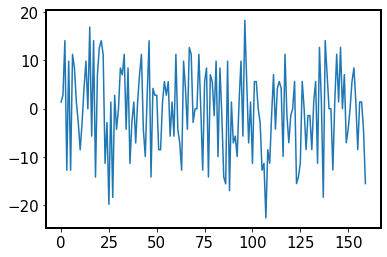

In [99]:
plt.plot(img[10,:])

In [100]:
np.median(img[10,:])

-0.059884604

In [101]:
max(img[10,:])

19.777424

image sum:  2589094.2
image[pMask] sum: 2099427.83221817
image[cMask] sum: 2203140.9564089775
image[dMask] sum: 2216136.1149826273


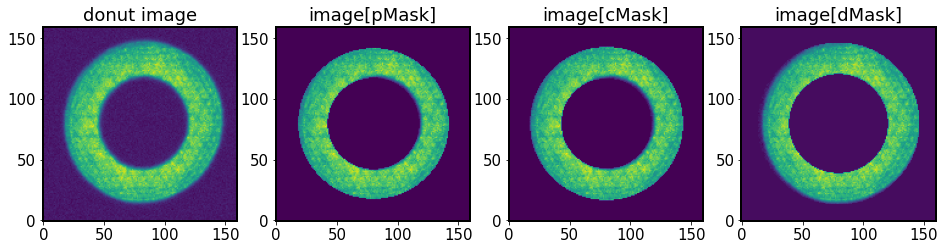

In [153]:
img = donutStamp.stamp_im.image.array
fig,ax = plt.subplots(1,4,figsize=(16,4))
pimage = img*imgIntra.pMask
cimage = img*imgIntra.cMask
dMask = get_danish_mask(data, field_xy[0], field_xy[1], donutStampSize)
dimage = img*dMask
img*(dMask-pMask)
ax[0].imshow(img, origin='lower')
ax[1].imshow(pimage, origin='lower')
ax[2].imshow(cimage, origin='lower')
ax[3].imshow(dimage, origin='lower')

ax[0].set_title('donut image')
ax[1].set_title('image[pMask]')
ax[2].set_title('image[cMask]')
ax[3].set_title('image[dMask]')

print('image sum: ',np.sum(img))
print('image[pMask] sum:', np.sum(pimage))
print('image[cMask] sum:', np.sum(cimage))
print('image[dMask] sum:', np.sum(dimage))


dMask selects more than cMask with boundaryT=1 or pMask. The difference is : 

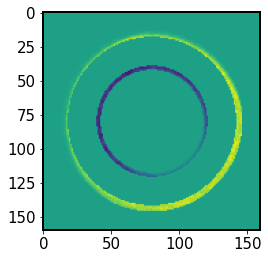

In [135]:
d_less_p_mask = dMask-imgIntra.pMask
plt.imshow(img*d_less_p_mask)

In [140]:
imgIntra.pMask[50:60,50:60]

array([[1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [142]:
np.array(dMask[50:60,50:60]).astype(int)

array([[1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [144]:
np.array(d_less_p_mask[50:60,50:60]).astype(int)

array([[ 0,  0, -1, -1, -1, -1, -1,  0,  0,  0],
       [ 0, -1, -1, -1, -1,  0,  0,  0,  0,  0],
       [-1, -1, -1, -1,  0,  0,  0,  0,  0,  0],
       [-1, -1, -1,  0,  0,  0,  0,  0,  0,  0],
       [-1, -1,  0,  0,  0,  0,  0,  0,  0,  0],
       [-1,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [-1,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0]])

In [136]:
np.sum(img*d_less_p_mask)

93976.13339378685

This shows how much more intensity is in pixels selected by danish vs pmask (those that were only in pmask are subtracted, those that are only in dmask are preserved).

So this shows that in that case, cMask leaves more than pMask - the intensity sum for image selected by cMask is larger by 11 than that selected by pMask. But it is a tiny difference. 

For the danish mask, the encircled intensity is almost identical *(by 1 count) to that selected by cMask. 


What's the overlap of masks? Sum the value of where the masks are 1 (if in both masks they're 1, then the difference would be 0, but if in cMask it's 1 and pMask it's 0, then the difference will be +1, while if in cMask it's 0 and pMask it's 1, the difference would be -1. 

First check if there are any pixels selected by pMask that were not selected by cMask:

In [163]:
np.where(imgIntra.cMask-imgIntra.pMask<0)

(array([], dtype=int64), array([], dtype=int64))

Ok, so cMask always selects same as pMask and more. How many more pixels get selected by cMask? 

In [157]:
np.sum(imgIntra.cMask-imgIntra.pMask)

516

How about danish mask v pMask : are there any that are selected in pMask but not in danish?  

In [145]:
only_pMask = len(np.where(dMask-imgIntra.pMask < 0)[0])
print(only_pMask)

744


And the inverse - those that are in danish, but not in cMask:
    

In [150]:
only_dMask = len(np.where(imgIntra.pMask - dMask < 0)[0])
print(only_dMask)

1852


And the overlap - where both pixels are 1:  `(1*0=0, 0*1=0, 1*1=1)`

In [151]:
overlap  = np.sum(imgIntra.pMask * dMask)
print(overlap)

6796.0


So that's why the sum of the difference between two masks is `1852-744 = 1108:  `

In [152]:
np.sum(dMask-imgIntra.pMask)

1108.0

So this is telling me that pMask selects 744 pixels more than pMask, and dMask selects 1852 pixels more than cMask.

The difference is substantial... 



/tmp/ipykernel_3580555/1583189886.py:6: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


Text(0.5, 1.0, 'Number of pixels selected: \ndanish & cMask')

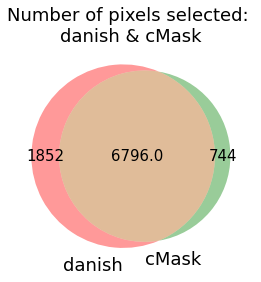

In [153]:
from matplotlib_venn import venn2 
from matplotlib import pyplot as plt
  
# depict venn diagram
venn2(subsets = (only_dMask, only_pMask, overlap), set_labels = ('danish', 'cMask'))
plt.show()
plt.title('Number of pixels selected: \ndanish & cMask')

I wonder how that changes as we go away from the focal plane... Would be best to test some corner sensors. 

Here is the data from Bryce for corner sensors. They're on epyc, so I copy over scp:



    cd /project/scichris/aos/masks_DM-33104/wfs/
    scp -rp suberlak@epyc.astro.washington.edu:/epyc/users/brycek/Commissioning/aos/aoclc_runs/closeLoopTests/cwfs_ps1_high_density_10_DM-34565  .
    
    
since it's a long transfer, and the `ssh` broke at some point, I open a screen on `lsst-devl02`, and use `rsync`  https://www.atlantic.net/vps-hosting/how-to-use-rsync-copy-sync-files-servers/ to skip files that already got copied:
`-r` for recursive sync of diles and subdirs, 
`-t` to keep timestamp of when files were last changed,
`-v` for verbose 
`-P` for  progress bar  https://www.cyberciti.biz/faq/show-progress-during-file-transfer/ 
`-h` for human-readable output  https://linux.die.net/man/1/rsync 
     
    cd /project/scichris/aos/masks_DM-33104/wfs/cwfs_ps1_high_density_10_DM-34565/phosimData/
    rsync -rtvPh suberlak@epyc.astro.washington.edu:/epyc/users/brycek/Commissioning/aos/aoclc_runs/closeLoopTests/cwfs_ps1_high_density_10_DM-34565/phosimData/  .


In [9]:
! ls /project/scichris/aos/masks_DM-33104/wfs/cwfs_ps1_high_density_10_DM-34565/

iter0


In [15]:
repo_dir  = '/project/scichris/aos/masks_DM-33104/wfs/cwfs_ps1_high_density_10_DM-34565/phosimData/'
extraFocalStamps1 = get_butler_stamps(repo_dir,instrument='LSSTCam', 
                                      iterN=0, detector="R04_SW0",
                                      dataset_type = 'donutStampsExtra', 
                                      collection='ts_phosim_9006070')

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline
for i in range(len(extraFocalStamps1)):
    donutStamp = extraFocalStamps1[i]
    print(donutStamp.calcFieldXY())

(1.122611111111111, -1.1095277777777777)
(1.1254444444444445, -1.2492500000000002)
(1.092222222222222, -1.2664166666666663)
(1.162, -1.136472222222222)
(1.1590555555555555, -1.175472222222222)
(1.1136111111111109, -1.166638888888889)
(1.1379444444444446, -1.1269166666666666)
(1.0856666666666666, -1.2448055555555557)
(1.1352222222222224, -1.1156388888888888)
(1.132, -1.26075)


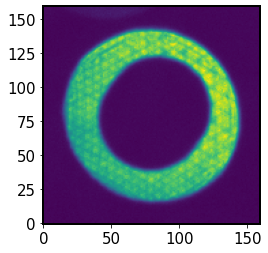

In [17]:
donutStamp = extraFocalStamps1[0]
plt.imshow(donutStamp.stamp_im.image.array, origin='lower')

In [47]:
from copy import copy



# select one donut
#for donut in donutStamps:
#donut = donutStamps[0]

def compare_pmask_dmask(donut, store):
    
           
    # store donut image
    #det = donut.detector_name
    store['detector'].append(donut.detector_name)
    #store[det]['donut'] = donut
    
    # make compensable image 
    comp_image = get_comp_image_for_donut(donut, boundaryT=1)
    #store[det]['comp_image'] = comp_image    

    # make danish mask
    field_xy = donut.calcFieldXY()
    stamp_size = 160
    x,y = field_xy
    r = np.sqrt(x**2.0+y**2.0)
    
    store['field_x'].append(x)
    store['field_y'].append(y)
    store['field_r'].append(r)
    
    dMask = get_danish_mask(x,y, stamp_size)
    #store[det]['dMask'] = dMask
   #store[det]
    # plot the images for illustration:
    # title should be the 
    # sensor,  x,y position, r from center of focal plane 

    img = donut.stamp_im.image.array
    
    
    # figure out the background level
    bkgnd_level = max(img[:,10])+10
    img_t = copy(img)
    # threshold the image so it's 0 below background level 
    img_t[img<bkgnd_level] = 0
    tsum = np.sum(img_t)
    print('Thresholded image sum:', )
    
    
    # convert pmask to bool, then invert 
    inv_pmask = ~np.bool_(comp_image.pMask)
    inv_cmask = ~np.bool_(comp_image.cMask)
    inv_dmask = ~np.bool_(dMask)

    # subtract pmask from dmask b/c usually dMask selects more 
    dp_mask = dMask-comp_image.pMask

    # multiply image by the mask
    pimage = inv_pmask*img_t
    cimage = inv_cmask*img_t
    dimage = inv_dmask*img_t
    dpimage = dp_mask*img_t
    
    isum = np.sum(img)
    psum = np.sum(pimage)
    csum = np.sum(cimage)
    dsum = np.sum(dimage)
    dpsum = np.sum(dpimage) 
    
    print('image sum: ', isum)
    print('image[~pMask] sum:', psum)
    print('image[~cMask] sum:', csum)
    print('image[~dMask] sum:', dsum)
    print('image[dMask-pMask] sum:', dpsum)
    
    #store
    store['img_sum'].append(isum)
    store['timg_sum'].append(tsum)
    store['imgt_inv_pmask_sum'].append(psum)
    store['imgt_inv_cmask_sum'].append(csum)
    store['imgt_inv_dmask_sum'].append(dsum)
    store['imgt_dpmask_sum'].append(dpsum)
    
    fig,ax = plt.subplots(1,4,figsize=(14,4))

    ax[0].imshow(img, origin='lower')
    ax[0].set_title(f'{detector}, r={r:.2f}'+r'$^{\degree}$')
    ax[1].imshow(pimage, origin='lower')
    ax[1].set_title('image[~pMask]')
    #ax[2].imshow(cimage, origin='lower')
    #ax[2].set_title('image[~cMask]')
    ax[2].imshow(dimage, origin='lower')
    ax[2].set_title('image[~dMask]')
    ax[3].imshow(dpimage, origin='lower')
    ax[3].set_title('image[dMask-pMask]')

   


Run over all corner detectors:

donutStampsExtra R04_SW0
Thresholded image sum: 10057417.0
image sum:  10227199.0
image[~pMask] sum: 1095873.2
image[~cMask] sum: 712776.2
image[~dMask] sum: 425513.8
image[dMask-pMask] sum: 670359.5333518982
Thresholded image sum: 7582033.5
image sum:  7793688.5
image[~pMask] sum: 1077646.1
image[~cMask] sum: 810527.5
image[~dMask] sum: 621716.2
image[dMask-pMask] sum: 455929.9351577759
Thresholded image sum: 6612758.5
image sum:  7400254.0
image[~pMask] sum: 612128.9
image[~cMask] sum: 363270.5
image[~dMask] sum: 194988.72
image[dMask-pMask] sum: 417140.1781616211
Thresholded image sum: 5519221.5
image sum:  5769395.0
image[~pMask] sum: 572866.75
image[~cMask] sum: 371915.94
image[~dMask] sum: 251481.83
image[dMask-pMask] sum: 321384.880859375
Thresholded image sum: 3170221.0
image sum:  3283215.2
image[~pMask] sum: 327297.8
image[~cMask] sum: 209303.08
image[~dMask] sum: 124743.336
image[dMask-pMask] sum: 202554.4517288208
Thresholded image sum: 1385049.9
image sum:  1608235.5
image

/tmp/ipykernel_4110600/4199438839.py:85: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,4,figsize=(14,4))


Thresholded image sum: 12558047.0
image sum:  13591891.0
image[~pMask] sum: 1260669.2
image[~cMask] sum: 792120.75
image[~dMask] sum: 1306620.4
image[dMask-pMask] sum: -45951.1408996582
Thresholded image sum: 9490103.0
image sum:  9992889.0
image[~pMask] sum: 1173708.0
image[~cMask] sum: 801947.3
image[~dMask] sum: 932916.75
image[dMask-pMask] sum: 240791.32502746582
Thresholded image sum: 6520525.0
image sum:  7201018.5
image[~pMask] sum: 639760.1
image[~cMask] sum: 388206.47
image[~dMask] sum: 355578.03
image[dMask-pMask] sum: 284182.0930175781
Thresholded image sum: 5577811.0
image sum:  6263661.0
image[~pMask] sum: 563795.1
image[~cMask] sum: 346910.62
image[~dMask] sum: 295122.84
image[dMask-pMask] sum: 268672.2502746582
Thresholded image sum: 5310178.5
image sum:  5862389.5
image[~pMask] sum: 647018.8
image[~cMask] sum: 449041.06
image[~dMask] sum: 866409.56
image[dMask-pMask] sum: -219390.74460601807
Thresholded image sum: 2837632.5
image sum:  3736629.0
image[~pMask] sum: 29359

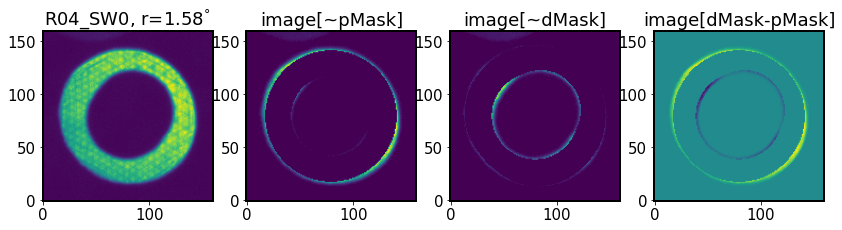

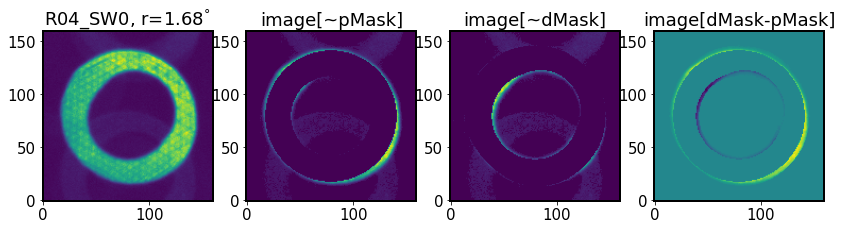

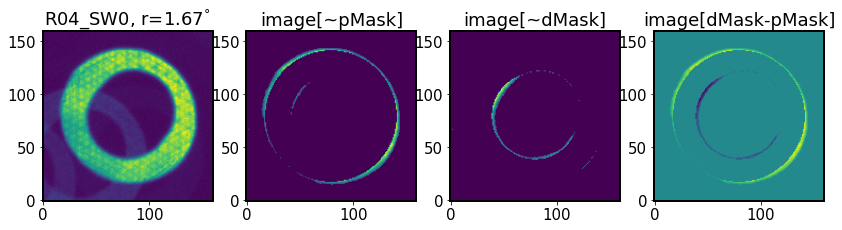

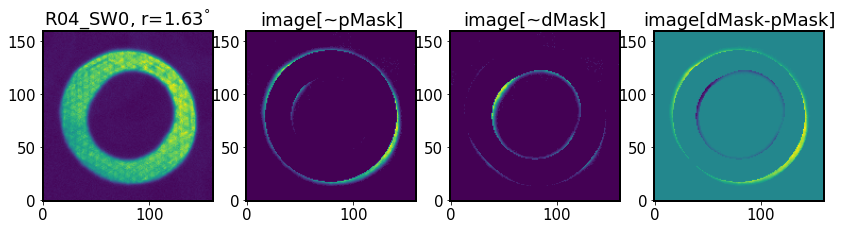

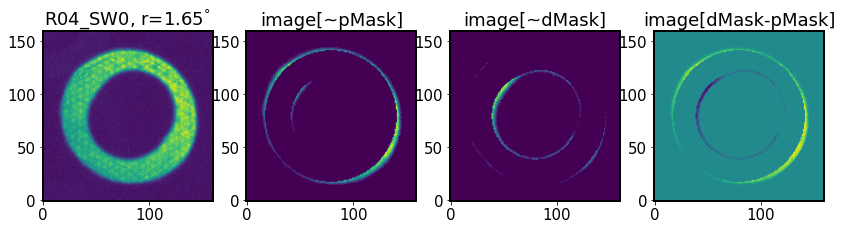

...

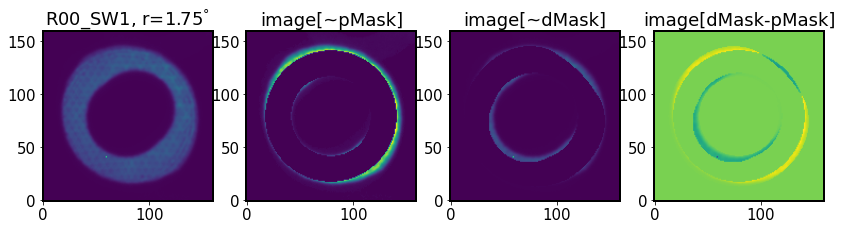

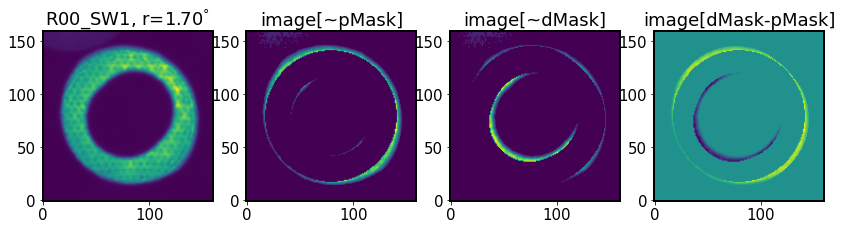

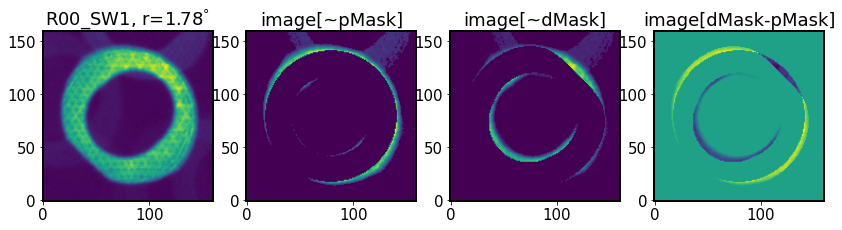

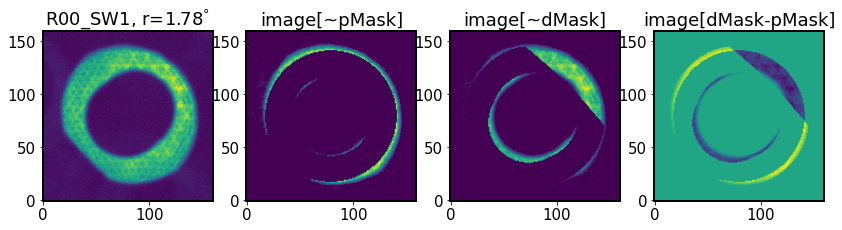

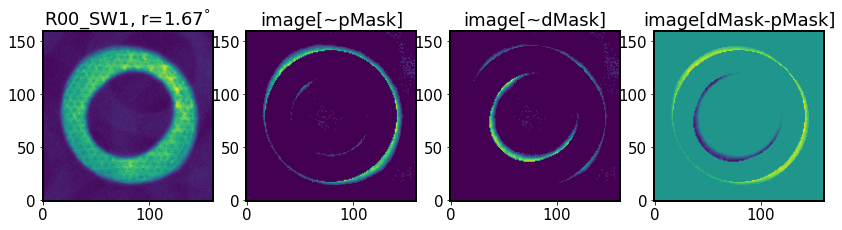

In [55]:
# initialize quick storage 
store = {}
store['detector'] = []
store['field_x'] = []
store['field_y'] = []
store['field_r'] = []
store['img_sum'] = []
store['timg_sum'] = []
store['imgt_inv_pmask_sum'] = []
store['imgt_inv_cmask_sum'] = []
store['imgt_inv_dmask_sum'] = []
store['imgt_dpmask_sum'] = []
    
# get the donut stamp
for dtype, app in zip(['Extra', 'Intra'],['SW0','SW1']):
    dataset_type = f'donutStamps{dtype}'
    for detector in [f"R04_{app}",f"R40_{app}", f"R44_{app}", f"R00_{app}"]:
        print(dataset_type, detector )
        donutStamps = get_butler_stamps(repo_dir,instrument='LSSTCam', 
                                              iterN=0, detector=detector,
                                              dataset_type = dataset_type, 
                                              collection='ts_phosim_9006070')
        for donut in donutStamps:
            compare_pmask_dmask(donut,store)

PostISR image sum  26952462.0
Thresholded image sum: 26575112.0
image sum:  26952462.0
image[~pMask] sum: 2913433.0
image[~cMask] sum: 2055345.6
image[~dMask] sum: 3038378.0
image[dMask-pMask] sum: -124944.98587799072
PostISR image sum  13116101.0
Thresholded image sum: 12856776.0
image sum:  13116101.0
image[~pMask] sum: 1728780.8
image[~cMask] sum: 1312129.9
image[~dMask] sum: 1294422.5
image[dMask-pMask] sum: 434358.0707397461
PostISR image sum  5236749.5
Thresholded image sum: 4855723.5
image sum:  5236749.5
image[~pMask] sum: 495162.1
image[~cMask] sum: 331156.53
image[~dMask] sum: 320479.03
image[dMask-pMask] sum: 174683.09244537354
PostISR image sum  4028995.8
Thresholded image sum: 3520062.8
image sum:  4028995.8
image[~pMask] sum: 355260.94
image[~cMask] sum: 244648.36
image[~dMask] sum: 285454.84
image[dMask-pMask] sum: 69806.09785461426
PostISR image sum  3130295.2
Thresholded image sum: 2983387.5
image sum:  3130295.2
image[~pMask] sum: 325480.9
image[~cMask] sum: 227775.53

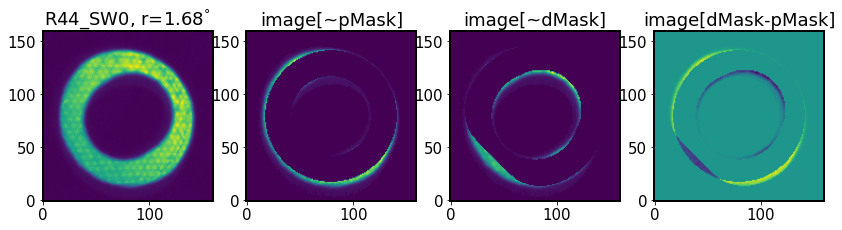

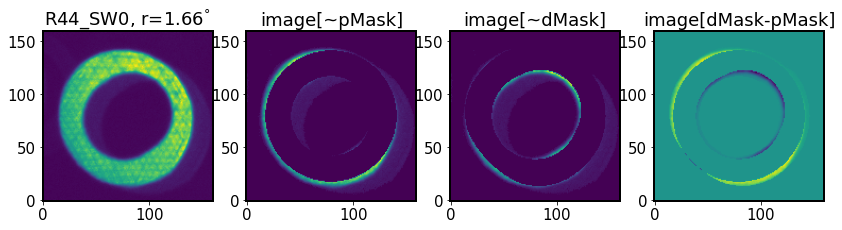

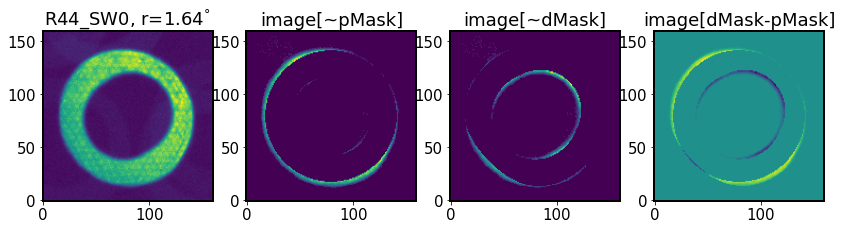

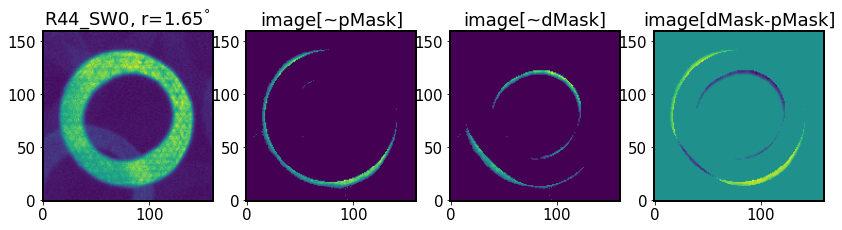

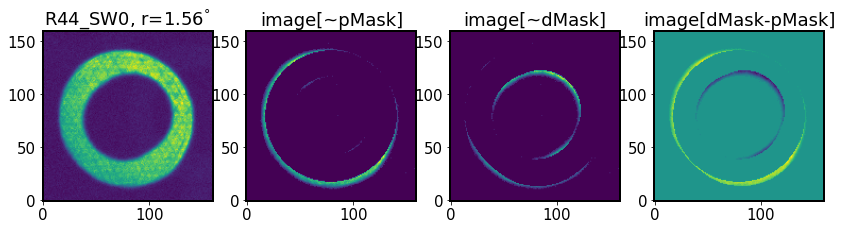

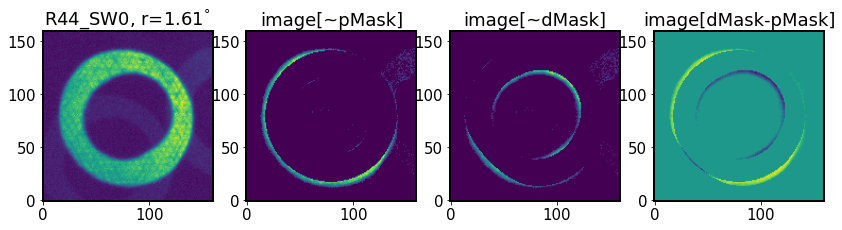

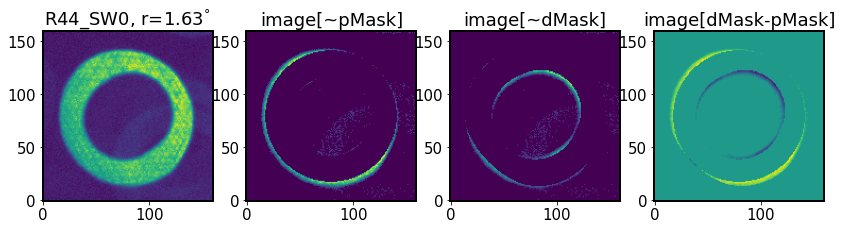

In [42]:
detector = "R44_SW0"
donutStamps = get_butler_stamps(repo_dir,instrument='LSSTCam', 
                                      iterN=0, detector=detector,
                                      dataset_type = 'donutStampsExtra', 
                                      collection='ts_phosim_9006070')
for donut in donutStamps:
    compare_pmask_dmask(donut)

PostISR image sum  34852424.0
Thresholded image sum: 34006970.0
image sum:  34852424.0
image[~pMask] sum: 4652303.0
image[~cMask] sum: 3556906.0
image[~dMask] sum: 3456791.0
image[dMask-pMask] sum: 1195512.451385498
PostISR image sum  21843874.0
Thresholded image sum: 21684802.0
image sum:  21843874.0
image[~pMask] sum: 3416428.8
image[~cMask] sum: 2715515.5
image[~dMask] sum: 2299075.8
image[dMask-pMask] sum: 1117352.9385566711
PostISR image sum  8327933.5
Thresholded image sum: 8024767.0
image sum:  8327933.5
image[~pMask] sum: 883142.6
image[~cMask] sum: 669099.5
image[~dMask] sum: 2004224.8
image[dMask-pMask] sum: -1121081.9887695312
PostISR image sum  9143887.0
Thresholded image sum: 8817439.0
image sum:  9143887.0
image[~pMask] sum: 1496049.2
image[~cMask] sum: 1215152.6
image[~dMask] sum: 1107150.2
image[dMask-pMask] sum: 388898.9423675537
PostISR image sum  5220395.5
Thresholded image sum: 4768894.0
image sum:  5220395.5
image[~pMask] sum: 526386.2
image[~cMask] sum: 401745.97


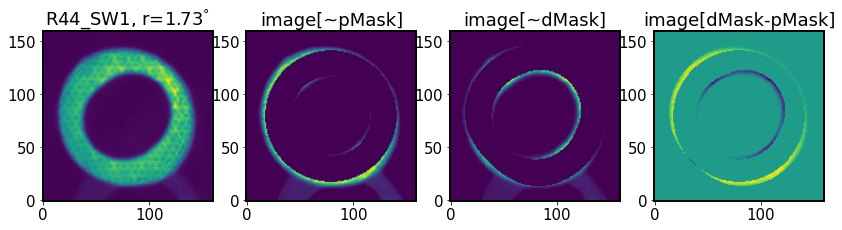

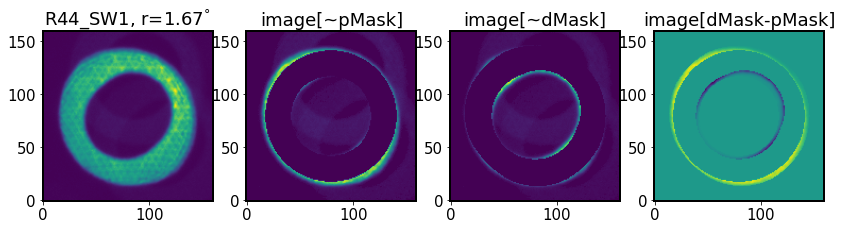

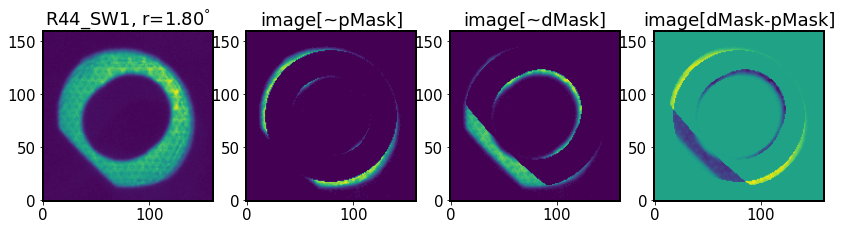

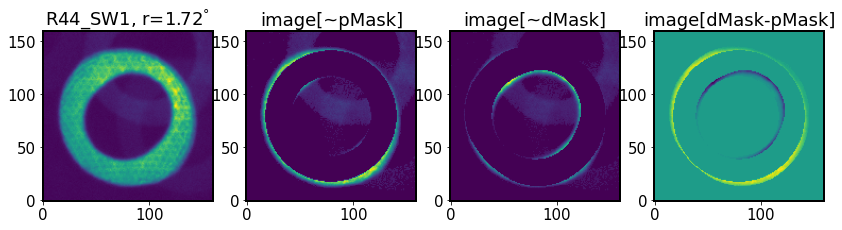

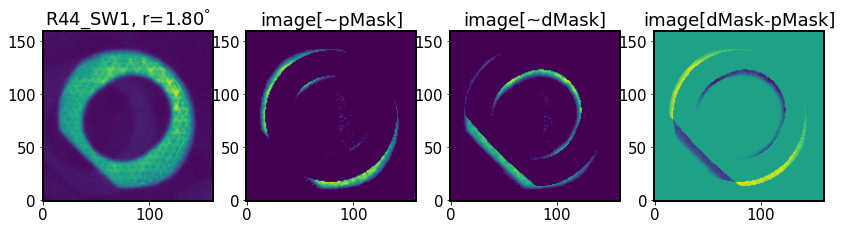

...

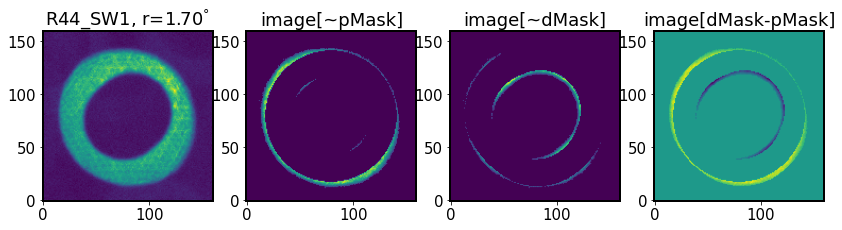

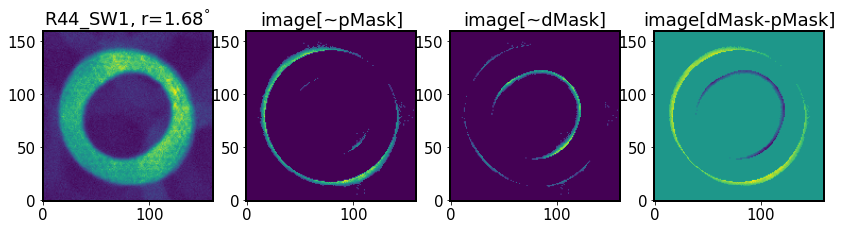

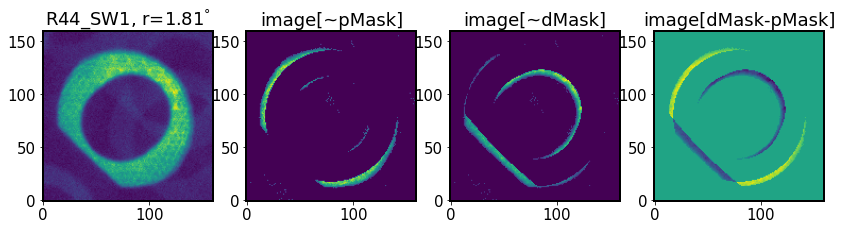

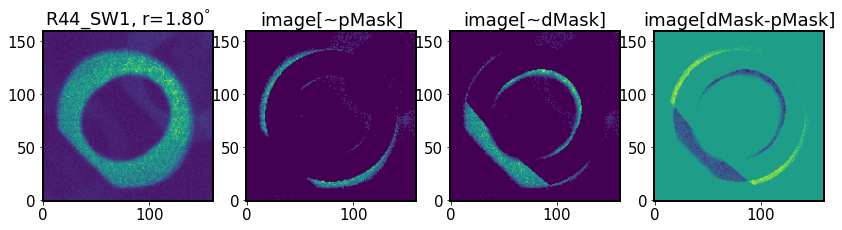

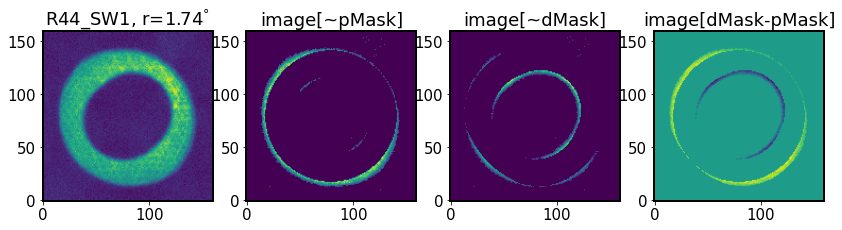

In [45]:
detector = "R44_SW1"
donutStamps = get_butler_stamps(repo_dir,instrument='LSSTCam', 
                                      iterN=0, detector=detector,
                                      dataset_type = 'donutStampsIntra', 
                                      collection='ts_phosim_9006070')
for donut in donutStamps:
    compare_pmask_dmask(donut)

plot the sums as a function of donut distance from the center of the focal plane:

In [59]:
store.keys()

dict_keys(['detector', 'field_x', 'field_y', 'field_r', 'img_sum', 'timg_sum', 'imgt_inv_pmask_sum', 'imgt_inv_cmask_sum', 'imgt_inv_dmask_sum', 'imgt_dpmask_sum'])

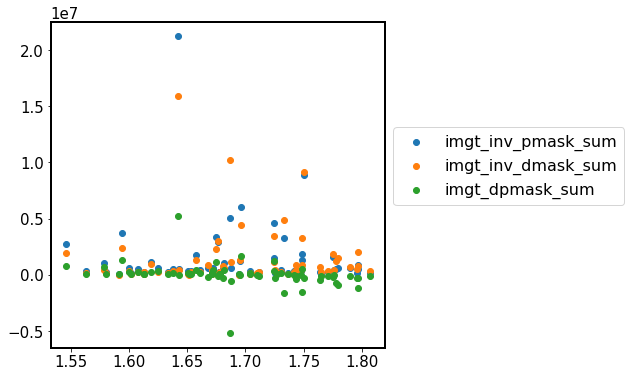

In [73]:
fig, ax = plt.subplots(1,1, figsize=(6,6))
for key in ['imgt_inv_pmask_sum','imgt_inv_dmask_sum','imgt_dpmask_sum']:
    ax.scatter(store['field_r'], store[key], label=key)
ax.legend(fontsize=16, bbox_to_anchor=(1,0.7))
ax.set_ylabel(r'$\sum$)

Text(0, 0.5, '$\\sum$timg[dM-pM] [counts]')

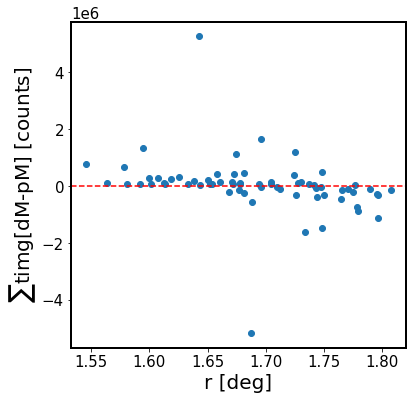

In [69]:
fig, ax = plt.subplots(1,1, figsize=(6,6))
ax.axhline(c='r',ls='--')
ax.scatter(store['field_r'], store['imgt_dpmask_sum'])
ax.set_xlabel('r [deg]')
ax.set_ylabel(r'$\sum$timg[dM-pM] [counts]')

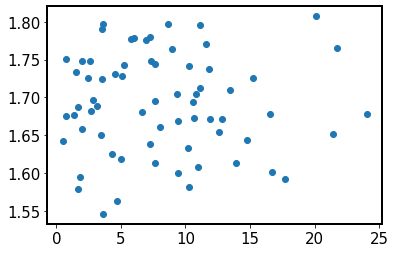

In [87]:

i = np.array(store['img_sum'])
t = np.array(store['timg_sum'])
perc = ((i-t)/i)*100
plt.scatter(perc, store['field_r'])
#plt.plot(store['img_sum'])

(array([13., 13.,  7.,  9., 12.,  4.,  4.,  1.,  3.,  1.]),
 array([ 0.4948444,  2.8512623,  5.2076807,  7.5640984,  9.920517 ,
        12.276935 , 14.633352 , 16.98977  , 19.34619  , 21.702606 ,
        24.059025 ], dtype=float32),
 <BarContainer object of 10 artists>)

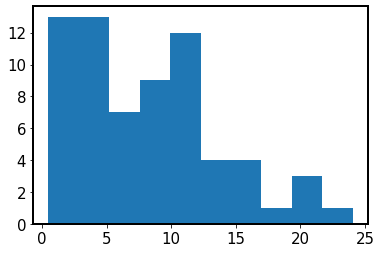

In [88]:
plt.hist(perc)

In [77]:
store['img_sum']

[10227199.0,
 7793688.5,
 7400254.0,
 5769395.0,
 3283215.2,
 1608235.5,
 1621557.4,
 1549143.1,
 1211249.9,
 1043921.6,
 4148756.0,
 2313764.8,
 2201012.0,
 26952462.0,
 13116101.0,
 5236749.5,
 4028995.8,
 3130295.2,
 3064917.0,
 2534775.5,
 37406476.0,
 34801908.0,
 17246306.0,
 13591891.0,
 9992889.0,
 7201018.5,
 6263661.0,
 5862389.5,
 3736629.0,
 12312735.0,
 10920446.0,
 5150540.0,
 5370188.5,
 4824370.0,
 3280180.0,
 2302202.0,
 2168111.0,
 1552565.5,
 1161265.4,
 26387020.0,
 4736327.0,
 4966266.0,
 4020619.5,
 3478064.0,
 2935985.2,
 2173388.5,
 2086660.2,
 1815956.5,
 1538514.4,
 34852424.0,
 21843874.0,
 8327933.5,
 9143887.0,
 5220395.5,
 4015945.2,
 3426337.8,
 2984078.8,
 2777970.2,
 2464440.0,
 1968104.6,
 1747666.6,
 153949000.0,
 64452028.0,
 51666520.0,
 11976538.0,
 5224200.5,
 5118798.0]

In [109]:
imgIntra.pMask[50:70,50:70]

array([[1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

In [107]:
np.shape(img[imgIntra.pMask])

(160, 160, 160)

What's done in `Algorithm.py`, in `_singleItr` , is the following:
    
    # self = Al
    # algoDir = os.path.join(configDir, "cwfs", "algo")
    # the default is 
    # https://github.com/lsst-ts/ts_wep/blob/develop/policy/cwfs/algo/fft.yaml
    # from algoParamFile.getSetting("boundaryThickness")) 
    boundaryT = self.getBoundaryThickness()  # default is 1 
    I1.makeMask(self._inst, model, boundaryT, 1)
    I2.makeMask(self._inst, model, boundaryT, 1)
    self._makeMasterMask(I1, I2, self.getPoissonSolverName())

    # Load the offAxis correction coefficients
    if model == "offAxis":
        offAxisPolyOrder = self.getOffAxisPolyOrder()
        I1.setOffAxisCorr(self._inst, offAxisPolyOrder)
        I2.setOffAxisCorr(self._inst, offAxisPolyOrder)

    # Cocenter the images to the center referenced to fieldX and
    # fieldY. Need to check the availability of this.
    I1.imageCoCenter(self._inst, debugLevel=self.debugLevel)
    I2.imageCoCenter(self._inst, debugLevel=self.debugLevel)

    # Update the self-initial image
    I1.updateImgInit()
    I2.updateImgInit()
    
Need to check what happens at each step...     

In [ ]:
# make an array with the same dimension as a donut 
# it doesn't matter for CompensableImage,
# but it is needed to 
x = np.linspace(-2,2,160)
y = np.linspace(-2,2,160)
xx, yy =np.meshgrid(x,y)
z = np.exp(np.cos(5*xx)-np.sin(5*yy))

In [1]:
# this yields puzzling results...
# find out why 

# Using 
# https://github.com/lsst-ts/ts_wep/blob/b672fa2b783a58779267b69f88c175a7c0284bfa/tests/cwfs/test_compensableImage.py#L82
import numpy as np
from lsst.ts.wep.Utility import getModulePath


def get_comp_image(boundaryT=8):

    modulePath = getModulePath()
    # can also use the ts_wep test image 
    imageFolderPath = os.path.join(
            modulePath, "tests", "testData", "testImages", "LSST_NE_SN25"
        )
    intra_image_name = "z11_0.25_intra.txt"
    imgFilePathIntra = os.path.join(imageFolderPath, intra_image_name)
    fieldXY = (1.185, 1.185)

    dimOfDonutOnSensor = 120
    opticalModel = "offAxis"
    maskScalingFactorLocal=1

    instDir = os.path.join(getConfigDir(), "cwfs", "instData")
    inst = Instrument(instDir)
    inst.config(
                CamType.LsstCam, dimOfDonutOnSensor, announcedDefocalDisInMm=1.0
            )


    imgIntra.setImg(
                fieldXY,
                DefocalType.Intra,
                imageFile=imgFilePathIntra
            )

    imgIntra.makeMask(inst, opticalModel, boundaryT, maskScalingFactorLocal)


    return imgIntra


comp_image1 = get_comp_image(boundaryT=1)
comp_image7 = get_comp_image(boundaryT=7)

fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(comp_image1.cMask)
ax[0].set_title('cMask, boundaryT=1')
ax[1].imshow(comp_image7.cMask)
ax[1].set_title('cMask, boundaryT=7')

NameError: name 'os' is not defined